## Background

In Lesson 10 of the fastai course (Part 2) Jeremy assigns us the following homework assignment:

> try picking one of the extra tricks we learned about like image-to-image, or negative prompts; see if you can implement negative prompt in your version of this; or try doing image-to-image; try adding callbacks

In this blog post I'll implement negative prompting using the diffusion loop code provided in the course's [Stable Diffusion with Diffusers](https://github.com/fastai/diffusion-nbs/blob/master/stable_diffusion.ipynb) notebook.

I'll start by copy/pasting all of the boilerplate code provided in that notebook, and running it to make sure we get the desired images.

In [1]:
#| code-fold: true
#| code-summary: "Show setup"
!pip install -qq diffusers transformers==4.46.2
!pip install -qq pillow==11.0.0

from diffusers import LMSDiscreteScheduler, AutoencoderKL, UNet2DConditionModel, StableDiffusionPipeline
from transformers import CLIPTextModel, CLIPTokenizer
from PIL import Image
from tqdm.auto import tqdm
from IPython.display import display
import torch, math

tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to("cuda")
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema", torch_dtype=torch.float16).to("cuda")
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", torch_dtype=torch.float16).to("cuda")

beta_start,beta_end = 0.00085,0.012
scheduler = LMSDiscreteScheduler(beta_start=beta_start, beta_end=beta_end, beta_schedule="scaled_linear", num_train_timesteps=1000)

height = 512
width = 512
num_inference_steps = 70
guidance_scale = 7.5
batch_size = 1

In [6]:
#| code-fold: true
#| code-summary: "Show stable diffusion implementation functions"
def text_enc(prompts, maxlen=None):
    if maxlen is None: maxlen = tokenizer.model_max_length
    inp = tokenizer(prompts, padding="max_length", max_length=maxlen, truncation=True, return_tensors="pt")
    return text_encoder(inp.input_ids.to("cuda"))[0].half()

def mk_img(t):
    image = (t/2+0.5).clamp(0,1).detach().cpu().permute(1, 2, 0).numpy()
    return Image.fromarray((image*255).round().astype("uint8"))

def mk_samples(prompts, g=7.5, seed=100, steps=70):
    bs = len(prompts)
    text = text_enc(prompts)
    uncond = text_enc([""] * bs, text.shape[1])
    emb = torch.cat([uncond, text])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * 15

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 2), ts)
        with torch.no_grad(): u,t = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(2)
        pred = u + g*(t-u)
        latents = scheduler.step(pred, ts, latents).prev_sample

    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

In [9]:
prompts = [
    'a photograph of an astronaut riding a horse',
    'an oil painting of an astronaut riding a horse in the style of grant wood'
]

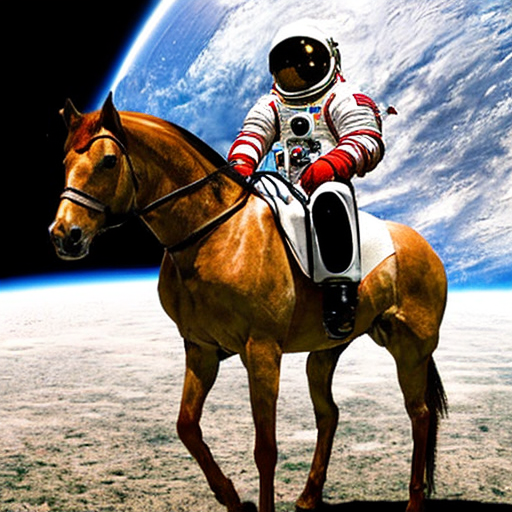

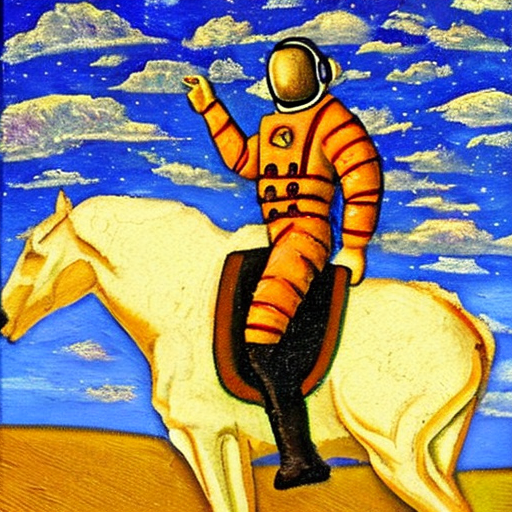

In [11]:
images = mk_samples(prompts)
for img in images: display(mk_img(img))

Looks good! These are the same two images generated in the course notebook.

## Negative Prompting

What is negative prompting? I'll illustrate an example using a stable diffusion pipeline:

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", variant="fp16", torch_dtype=torch.float16).to("cuda")

Here is the generated image for the prompt "Labrador in the style of Vermeer".

  0%|          | 0/50 [00:00<?, ?it/s]

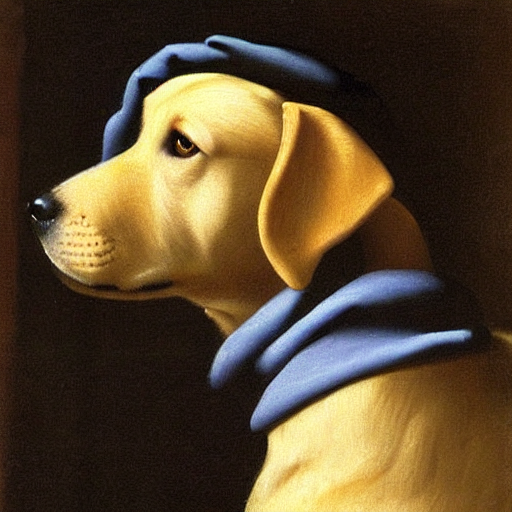

In [14]:
torch.manual_seed(1000)
prompt = "Labrador in the style of Vermeer"
pipe(prompt).images[0]

And here's the result after passing a negative prompt: "blue"

  0%|          | 0/50 [00:00<?, ?it/s]

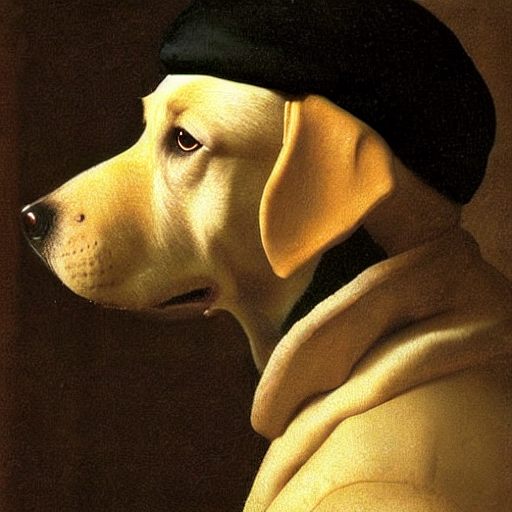

In [247]:
torch.manual_seed(1000)
pipe(prompt, negative_prompt="blue").images[0]

Looking at these images side-by-side, without the negative prompt (left) and with the negative prompt (right) we see that with negative prompting, the blue hat and scarf are replaced with black ones. Additionally, the labrador's eyes, snout, nose, ears and other features have also slightly changed.

It's important to note that not all seeds return such desired results. For example, here is another lab in the style of Vermeer, notice the blue head scarf.

  0%|          | 0/50 [00:00<?, ?it/s]

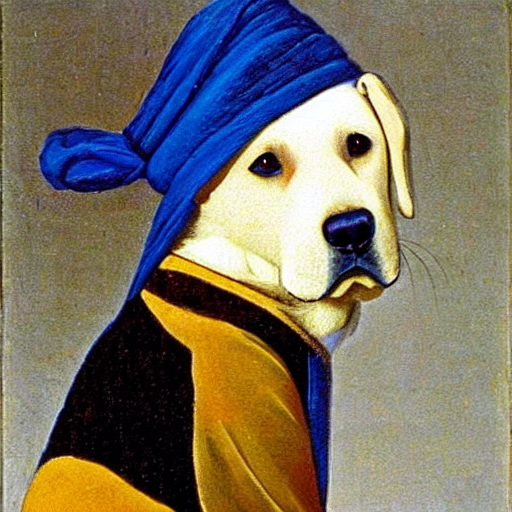

In [15]:
torch.manual_seed(100)
pipe(prompt).images[0]

The negative prompt result does remove the blue from the image, but it also considerably changes other features of the image.

  0%|          | 0/50 [00:00<?, ?it/s]

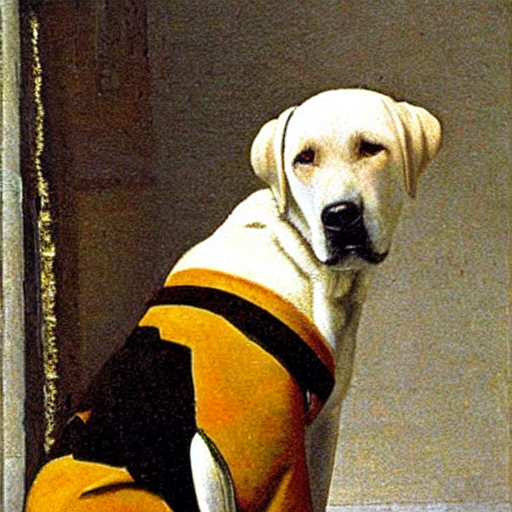

In [16]:
torch.manual_seed(100)
pipe(prompt, negative_prompt="blue").images[0]

### Original Image

I'll choose the following generated image as the baseline image, using the same prompt and number of steps as the stable diffusion `pipe` generation, but now 
using the code from Lesson 10:

/tmp/ipykernel_75/2343166050.py:8: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

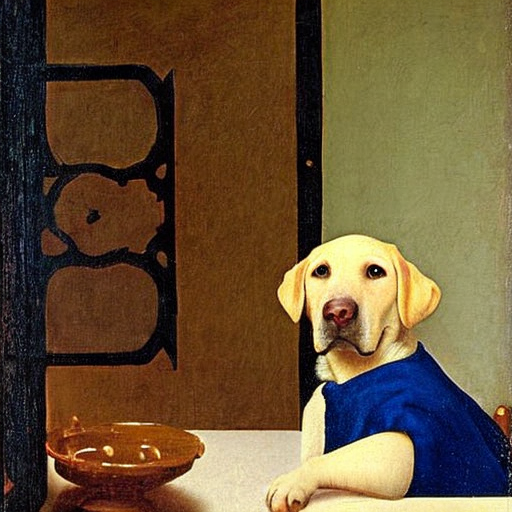

In [15]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, seed=18, steps=70)
for img in images: display(mk_img(img))

## Working Implementation: Replace `u` with `n`

I tried out four different implementations of negative prompting. Three of them did not succeed but I did learn a lot from implementing them. I'll go into detail 
into those approaches later on in this post. The working solution I came up with was relatively simpler than the first two implementations I attempted.

In the diffusion loop, the following line of code is key:

```python
pred = u + g*(t-u)
```

`u` is the "starting point" or "reference point" for our predicted noise. It represents some general noisy-image features. `t` is our desired direction, and 
`g` is the _guidance scale_, amplifying the difference between `t` and `u`. Overall, we are moving _away_ from `u` and _towards_ `t`. 

In this case, `u` is the UNet noise prediction given the unconditioned (empty string) prompt, and `t` is the UNet noise prediction given the desired prompt. 
Moving away from one prompt and moving towards another prompt sounded to me exactly like the goal of negative prompting. We want to move away from our 
negative prompt and towards our desired prompt. To implement this, I simply added a `negative_prompt` that defaults to an empty string (our unconditioned prompt 
scenario), passed this string to `text_enc` in the following line:

```python
uncond = text_enc([negative_prompt] * bs, text.shape[1])
```
And otherwise kept the `mk_samples` code unchanged.

In [17]:
#| code-fold: true
#| code-summary: "Show modified `mk_samples` function"
def mk_samples(prompts, negative_prompt = "", g=7.5, seed=100, steps=70):
    bs = len(prompts)
    text = text_enc(prompts)
    uncond = text_enc([negative_prompt] * bs, text.shape[1])
    emb = torch.cat([uncond, text])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * 15

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 2), ts)
        with torch.no_grad(): u,t = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(2)
        pred = u + g*(t-u)
        latents = scheduler.step(pred, ts, latents).prev_sample

    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

Here is the output of `mk_samples` with no `negative_prompt` specific, this is essentially our normal classifier-free guidance implementation:

/tmp/ipykernel_52/3351458932.py:8: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

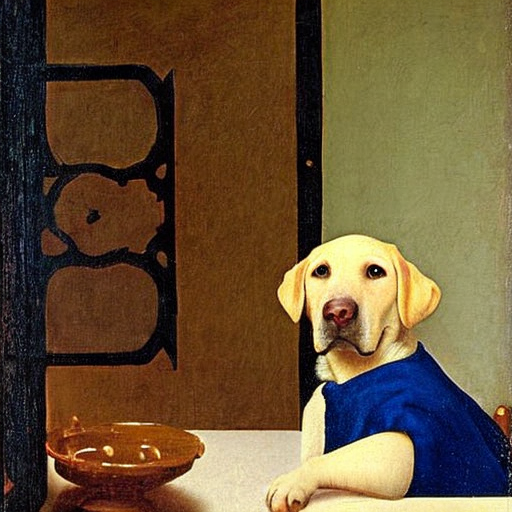

In [18]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, seed=18, steps=70)
for img in images: display(mk_img(img))

And here is the output with a `negative_prompt` provided:

/tmp/ipykernel_52/3351458932.py:8: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

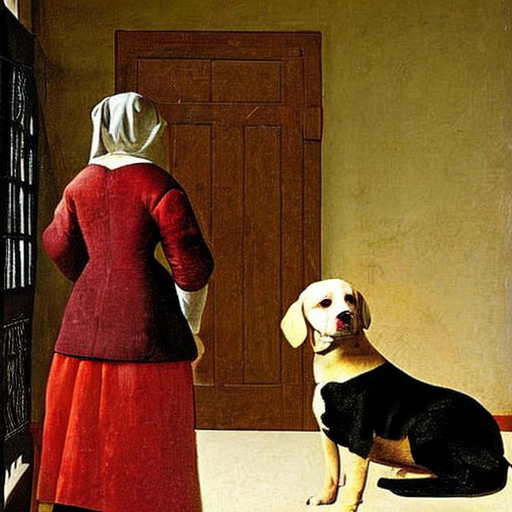

In [19]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=18, steps=70)
for img in images: display(mk_img(img))

This results in a (somewhat) desired image: ✅ the blue clothing has been removed (and changed to black) but ❌ the image structure and composition 
has _considerably_ changed.

I found a seed (`20`) which performs better. Here is the original unconditioned prompt result:

/tmp/ipykernel_52/3351458932.py:8: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

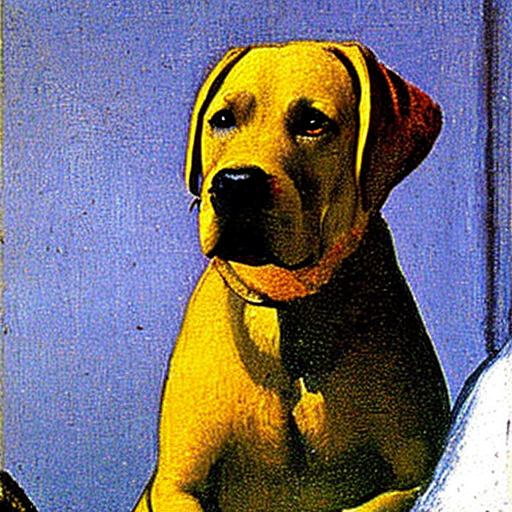

In [21]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, seed=20, steps=70)
for img in images: display(mk_img(img))

And here is the result after replacing the unconditioned prompt with the negative prompt `"blue"`:

/tmp/ipykernel_52/3351458932.py:8: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

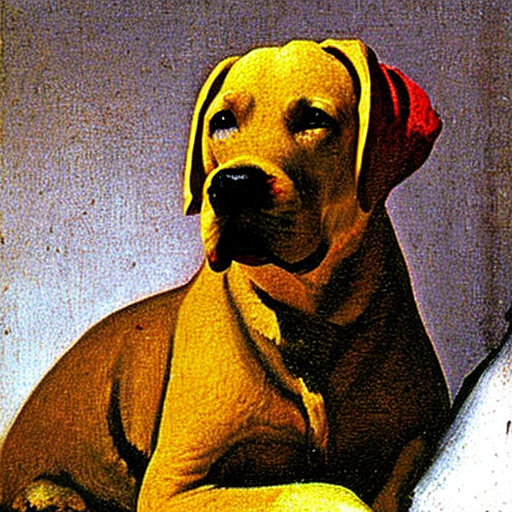

In [22]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=20, steps=70)
for img in images: display(mk_img(img))

That's much better! The dog does have a different pose (though a similar perspective), but the blue has been removed from the image.

As a sanity check, I wanted to see how Huggingface implements negative prompting in the `diffusers` library. I was thrilled (and relieved) to see that they 
implement it similarly! In the [`StableDiffusionPipeline.encode_prompt` method](https://github.com/huggingface/diffusers/blob/89e4d6219805975bd7d253a267e1951badc9f1c0/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py#L454) 
they simply assign the negative prompt tokens to the `uncond_tokens` variable:

```python
elif isinstance(negative_prompt, str):
                uncond_tokens = [negative_prompt]
```

then they embed these tokens:

```python

negative_prompt_embeds = self.text_encoder(
                uncond_input.input_ids.to(device),
                attention_mask=attention_mask,
            )
```

And return them along with the desired prompt embeddings:

```python
return prompt_embeds, negative_prompt_embeds

```

They then concatenate the desired and negative prompt embeddings:

```python
prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])
```

And in the diffusion loop they get the UNet predictions:

```python
noise_pred = self.unet(
    latent_model_input,
    t,
    encoder_hidden_states=prompt_embeds,
    timestep_cond=timestep_cond,
    cross_attention_kwargs=self.cross_attention_kwargs,
    added_cond_kwargs=added_cond_kwargs,
    return_dict=False,
)[0]

```

and perform classifier-free guidance (where `noise_pred_uncond` are the UNet predictions for the negative prompt):

```python
if self.do_classifier_free_guidance:
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + self.guidance_scale * (noise_pred_text - noise_pred_uncond)
```

## Implementation 1: `pred = u + g*(t-u-n)`

The first approach I tried was to modify the classifier-free guidance code from this:

```python
pred = u + g*(t-u)
```

to this:

```python
pred = u + g*(t-u-n)
```

My motivation for this was that this subtraction was analogous to "moving away from `n`". In hindsight, this was a good first attempt and eventually led to 
(somewhat accidentally) implementing the correct solution as I was throwing things at the wall to see if they stuck.


I modified `mk_samples` with the following changes:

- Create a separate text embeddings (`n_embs`) for the negative prompt.
- Concatenate `n_embs` to `uncond` and `text`.
- Multiply `[latents]` by `3` when passing it to the `scheduler` as we now have three embeddings.
- `chunk` the UNet predictions into `3` instead of `2`.
- Replace `pred = u + g*(t-u-n)` with `pred = u + g*(t-u-n)`.

In [23]:
#| code-fold: true
#| code-summary: "Show modified `mk_samples` function"
def mk_samples(prompts, negative_prompt = "", g=7.5, seed=100, steps=70):
    bs = len(prompts)
    text = text_enc(prompts)
    uncond = text_enc([""] * bs, text.shape[1])
    n_embs = text_enc([negative_prompt] * bs, text.shape[1])
    emb = torch.cat([uncond, text, n_embs])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * 15

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 3), ts)
        with torch.no_grad(): u,t,n = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(3)
        pred = u + g*(t-u-n)
        latents = scheduler.step(pred, ts, latents).prev_sample

    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

Unfortunately, this resulted in garbled noise!

/tmp/ipykernel_52/3564900662.py:9: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

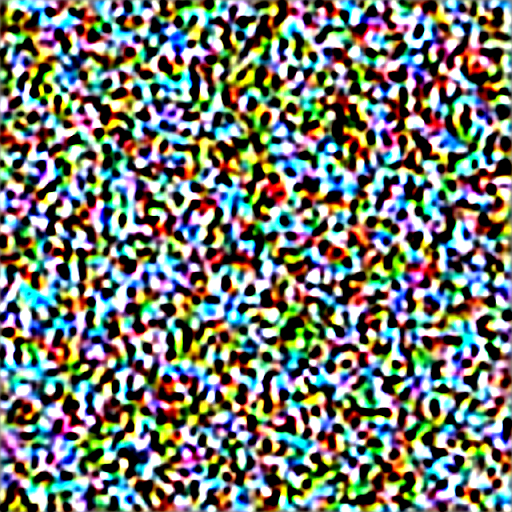

In [24]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=20, steps=70)
for img in images: display(mk_img(img))

## Implementation 2: `pred = u + g*(2*t-u-n)`

As I was experimenting with the above `mk_samples` implementation, I found some success multiplying `t` by a scalar factor.

In [72]:
#| code-fold: true
#| code-summary: "Show modified `mk_samples` function"
def mk_samples(prompts, negative_prompt = "", g=7.5, seed=100, steps=70):
    bs = len(prompts)
    text = text_enc(prompts)
    uncond = text_enc([""] * bs, text.shape[1])
    n_embs = text_enc([negative_prompt] * bs, text.shape[1])
    emb = torch.cat([uncond, text, n_embs])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * 15

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 3), ts)
        with torch.no_grad(): u,t,n = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(3)
        pred = u + g*(2*t-u-n)
        latents = scheduler.step(pred, ts, latents).prev_sample

    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

The resulting image, for both seeds `20` and `18`, are not bad! For `seed=20` the generated image looks coherent and similar to the structure and 
composition of the original image though the background still contains blue-ish tones,

The result for `seed=18` in my opinion is actually better than the `pred = n + g*(t-n)` implementation! Although the dog's pose has changed, the dog is 
no longer wearing a blue sweater (instead it's black) and more importantly, this approach has not generated a woman standing next to him.

/tmp/ipykernel_52/4112522131.py:9: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

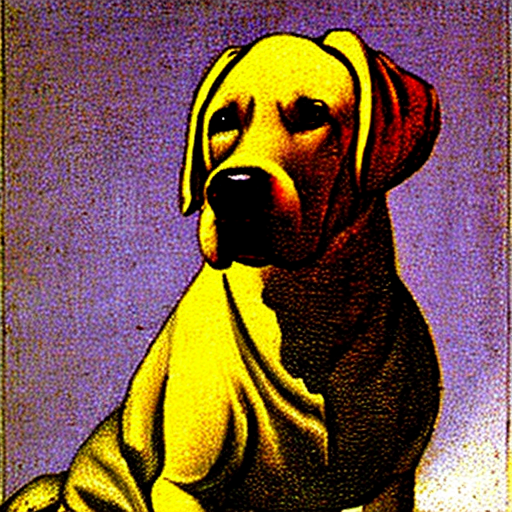

In [26]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=20, steps=70)
for img in images: display(mk_img(img))

/tmp/ipykernel_52/4112522131.py:9: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

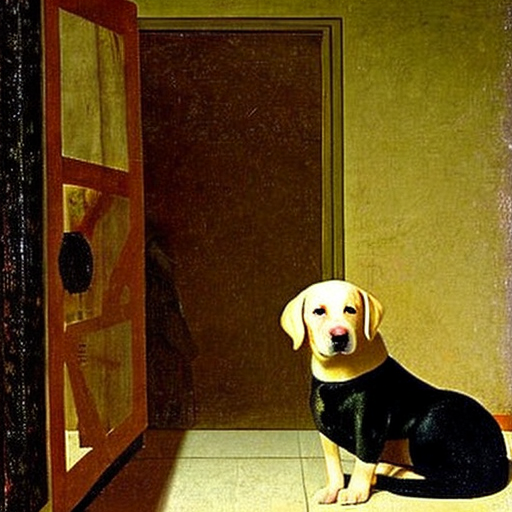

In [27]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=18, steps=70)
for img in images: display(mk_img(img))

I don't understand the intuition behind why, but it seems like `2` is the magical factor for this implementation (in terms of generating somewhat stable 
images). Here's a slightly different prompt:

/tmp/ipykernel_52/4112522131.py:9: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

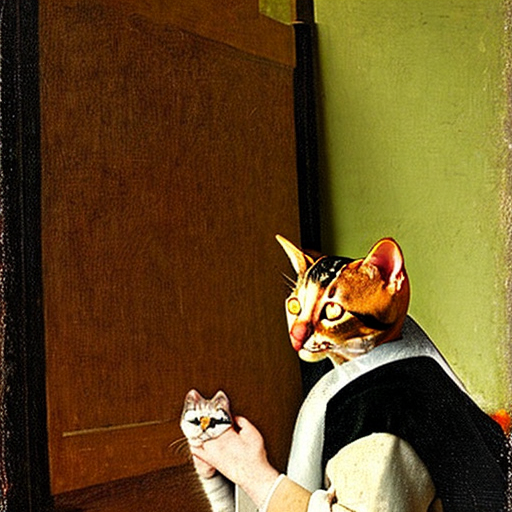

In [74]:
prompts = ["Cat in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=18, steps=70)
for img in images: display(mk_img(img))

I was curious to see how the result changed given different values of the factor multiplying `t`. I tried 100 different factors, incrementing from 
`1` to `3`, for `seed=18`:

In [28]:
#| code-fold: true
#| code-summary: "Show modified `mk_samples` function"
def mk_samples(prompts, negative_prompt = "", g=7.5, seed=100, steps=70, t_factor=2):
    bs = len(prompts)
    text = text_enc(prompts)
    uncond = text_enc([""] * bs, text.shape[1])
    n_embs = text_enc([negative_prompt] * bs, text.shape[1])
    emb = torch.cat([uncond, text, n_embs])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * 15

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 3), ts)
        with torch.no_grad(): u,t,n = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(3)
        pred = u + g*(t_factor*t-u-n)
        latents = scheduler.step(pred, ts, latents).prev_sample

    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

In [ ]:
images = []
prompts = ["Labrador in the style of Vermeer"]
for i in range(100):
  img = mk_samples(prompts, negative_prompt="blue", seed=18, t_factor=1 + (i+1)/50)
  images.append(img)

In [35]:
from PIL import Image, ImageDraw, ImageFont
imgs = [mk_img(im.squeeze()) for im in images]

for i, image in enumerate(imgs):
  font = ImageFont.load_default().font_variant(size=24)
  draw = ImageDraw.Draw(image)
  text = f"t_factor = {round(1 + (i+1)/50, 2)}"
  bbox = draw.textbbox((10, 10), text, font=font)  # Get text boundaries
  draw.rectangle(bbox, fill='black')  # Draw black background
  ImageDraw.Draw(image).text((10, 10), text, font=font, fill="white")
    
imgs[0].save(f't_factor_18.gif', save_all=True, append_images=imgs[1:], duration=100, loop=0)

![t_factor GIF](t_factor_18.gif)

We can see that for a only a very small range of `t_factor` values (around 2.00) do we get a coherent image.

In [46]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In fact for only three `t_factor` values out 100 (2.00, 2.02, 2.04) does the diffusion loop generate coherent images, and only in one of those (2.00) does 
the composition and style match the desired prompt ("in the style of Vermeer").

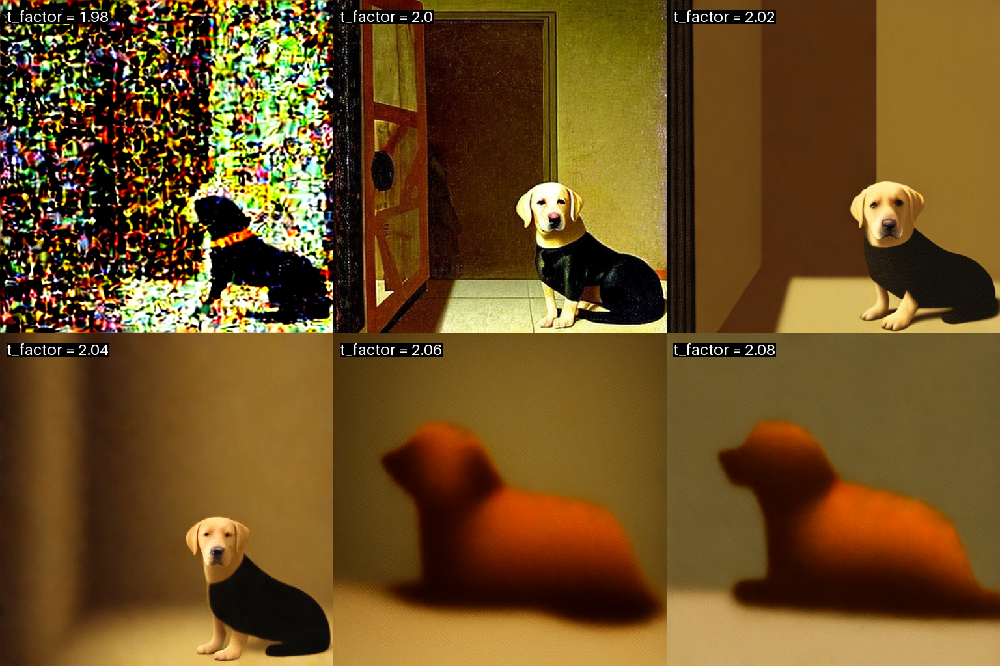

In [50]:
image_grid([imgs[i] for i in [48, 49, 50, 51, 52, 53]], 2, 3)

## Implementation 2: `pred = u + g*(t-u-n_factor*n)`

With some success achieved with that implementation, I decided to try a variant: scaling `n`.

In [51]:
#| code-fold: true
#| code-summary: "Show modified `mk_samples` function"
def mk_samples(prompts, negative_prompt = "", g=7.5, seed=100, steps=70, n_factor=0.5):
    bs = len(prompts)
    text = text_enc(prompts)
    uncond = text_enc([""] * bs, text.shape[1])
    n_embs = text_enc([negative_prompt] * bs, text.shape[1])
    emb = torch.cat([uncond, text, n_embs])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * 15

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 3), ts)
        with torch.no_grad(): u,t,n = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(3)
        pred = u + g*(t-u-n_factor*n)
        latents = scheduler.step(pred, ts, latents).prev_sample

    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

However, with this approach, I found that only negligible values of `n_factor` produced coherent images, and `n`'s impact was so small that it did not 
remove any "blue" elements from the image.

/tmp/ipykernel_52/989121822.py:9: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

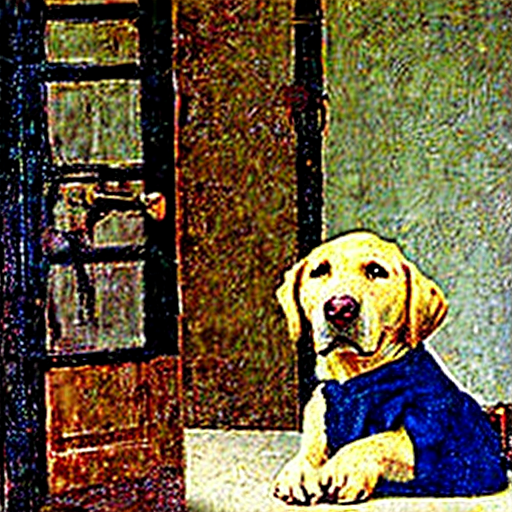

In [60]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=18, n_factor=0.005)
for img in images: display(mk_img(img))

/tmp/ipykernel_52/989121822.py:9: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

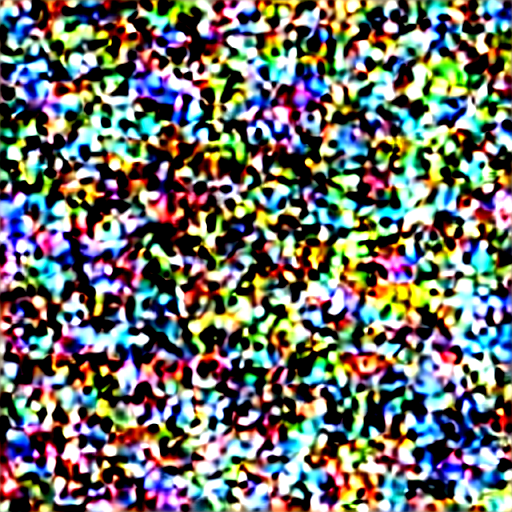

In [61]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=18, n_factor=0.05)
for img in images: display(mk_img(img))

## Implementation 3: Using Rejection of `t` on `n`

My final implementation was the result of a lengthy conversation with Claude where I explicitly asked it _not_ to provide me with fully fleshed solutions to 
my prompts but to respond with probing questions based on first principles. This led me to a very engaging and interesting conversation where we explored 
and developed my intuition of vector geometry.

The implementation I came up with was based on the concept of _rejection_. In the image from Wikipedia below, $a_2$ is the rejection of $a$ onto $b$. 
In other words, it's the component of vector $a$ that is perpendicular to vector $b$. We want to move our noise predictions away from `n`---adding the 
component of `t` that is perpendicular to `n` seemed an intuitive implementation.

![Vector rejection](1.png)

In my sketch below, I visualize in a simplified 2-D space how adding to `t` a vector `p` perpendicular to `n` moves it away from it.

![Moving `t` away from `n` with `p`](2.png)

The implementation of rejection between two vectors `t` and `n` (thanks Claude) is:

```python
p = t - (t * n).sum(dim=1, keepdim=True) * n
```

Here's a trivial example showing that the full vector `a` is the perpendicular component to the orthogonal `b`:

In [64]:
a = torch.tensor([[0, 0, 0]])
b = torch.tensor([[1, 1, 1]])
a - (a * b).sum(dim=0, keepdim=True) * b

tensor([[0, 0, 0]])

Here's the modifications I made to `mk_samples`:

- Calculate the rejection of `t` onto `n`: `p = t - (t * n).sum(dim=1, keepdim=True) * n`.
- Add this vector (scaled) to the noise prediction: `pred = u + g*(t-u) + g2*p`.

In [68]:
#| code-fold: true
#| code-summary: "Show modified `mk_samples` function"
def mk_samples(prompts, negative_prompt = "", g=7.5, seed=100, steps=70, g2=1):
    bs = len(prompts)
    text = text_enc(prompts)
    uncond = text_enc([""] * bs, text.shape[1])
    n_embs = text_enc([negative_prompt] * bs, text.shape[1])
    emb = torch.cat([uncond, text, n_embs])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * 15

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 3), ts)
        with torch.no_grad(): u,t,n = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(3)
        
        p = t - (t * n).sum(dim=1, keepdim=True) * n
        
        pred = u + g*(t-u) + g2*p
        latents = scheduler.step(pred, ts, latents).prev_sample

    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

On paper this seemed like an interesting approach but I found that only small values of `g2` allowed for coherent image generation, and even then, it did 
not remove any "blue" components.

/tmp/ipykernel_52/3545698243.py:9: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

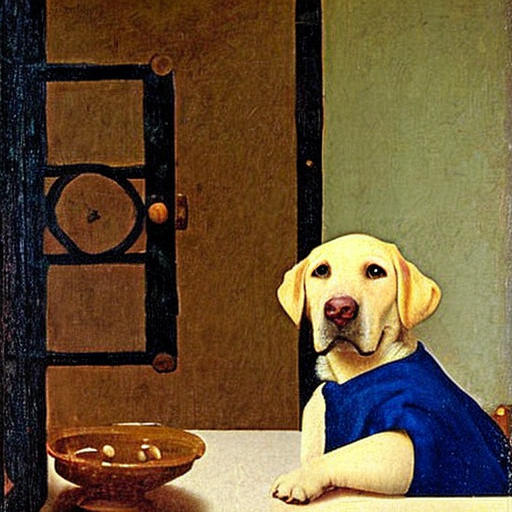

In [71]:
prompts = ["Labrador in the style of Vermeer"]
images = mk_samples(prompts, negative_prompt="blue", seed=18, g2=0.001)
for img in images: display(mk_img(img))

## Final Thoughts

Working on these small, relatively contained stable diffusion experiments has been really fun and informative. On one hand, it's broken some of the "mystique" 
around diffusion, as I'm able to change and somewhat control image generation with a few lines of code. On the other hand, it's given a deeper insight into 
how mercurial and sensitive, and sometimes counterintuitive, the diffusion loop can be.

For negative prompting, the simplest implementation was the most stable one. Swapping the unconditioned prompt with the negative prompt allows for seemingly 
guaranteed coherent image generation (although I'm sure there will be prompts that would break it!). That being said, I found that `pred = u+g*(2*t-u-n)` 
yielded a better image generation for `seed=18` at the cost of a high level of difficulty (or chance in my case) of finding the right factor to 
multiply `t` with.

In the coming blog posts, I'll be implementing other diffusion tricks, such as image-to-image generation and callbacks. 